<a href="https://colab.research.google.com/github/meglee67/sqlite_database_operations/blob/main/HHA504_HW3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Load in packages

In [4]:
import pandas as pd

In [2]:
import numpy as np

# 1. Data Exploration and Analysis

### Load in datasets

In [37]:
df_stony = pd.read_csv('stonybrook.csv')

In [21]:
# Initially got a warning of "Specify dtype option on import or set low_memory=False" so then I found the solution below but it was "error_bad_lines=False". Doing that gave me a new message that "The error_bad_lines argument has been deprecated and will be removed in a future version" so I changed the "error_bas_lines=False" to on_bad_lines='skip'
df_nyu = pd.read_csv('nyu.csv', sep=',', on_bad_lines='skip', index_col=False, dtype='unicode')

In [70]:
df_goodsam = pd.read_csv('goodsam.csv', low_memory=False, encoding='latin-1')

### Inspecting Shape

In [50]:
# Check the size and shape of df_goodsam
print("Number of rows:", df_goodsam.shape[0])
print("Number of columns:", df_goodsam.shape[1])

Number of rows: 448756
Number of columns: 5


In [55]:
# Check using the size function
print("Using size: ", df_goodsam.size)

Using size:  2243780


In [16]:
# Check the size and shape of df_nyu
print("Number of rows:", df_nyu.shape[0])
print("Number of columns:", df_nyu.shape[1])

Number of rows: 49445
Number of columns: 412


In [18]:
# Check using the size function
print("Using size: ", df_nyu.size)

Using size:  20371340


Looks like the NYU dataset (20371340) is much larger than the Stonybrook dataset (2243780)

### Previewing Data

In [56]:
# Looking at the first 5 rows of df_goodsam
df_goodsam.head(5)

,Procedure ID,HCPCS/CPT Code,Description,Gross Charge,Discounted Cash Price (Gross Charges)
0,124,,FORCEPS BBCK ENDO BOWEL,3114,3114.0
1,350,,ADAPTER SYR 18GA LUER ST,141,141.0
2,380,,ADAPTER MALE LL 3/16,1432,1432.0
3,1350,,CLP ANRSM 9X3.5MM SGTA27,8079,8079.0
4,1360,,CLP ANRSM 9X5MM SGTA30,8079,8079.0


In [22]:
# Looking at the first 5 rows of df_nyu
df_nyu.head(5)

,Identifier Code,Billing Code,Identifier Description,NYU Langone Long Island Gross Charges,NYU Langone Long Island Discounted Cash Price,AETNA HMO,AETNA INDEMNITY,BCBS GHI COMPOSITE,BCBS HMO,BCBS INDEMNITY,...,HEALTHFIRST ESSENTIAL PLAN 1&2,HEALTHFIRST GOLD LEAF EXCHANGE,HEALTHFIRST BRONZE LEAF EXCHANGE,HEALTHFIRST GREEN LEAF EXCHANGE,HEALTHFIRST PLATINUM LEAF EXCHANGE,HEALTHFIRST SILVER LEAF EXCHANGE,"HEALTHFIRST BRONZE TOTAL, PRO, PLUS EPO",HEALTHNET PPO,De-identified Minimum,De-identified Maximum
0,2023696,19120,HC EXC CYST/ABERRANT BREAST TISSUE OPEN 1/> LE...,7750.52,1472.6,12254.47,7750.52,9709,9709,9709,...,1792.32,1792.32,1792.32,1792.32,1792.32,1792.32,1792.32,6277.92,776.73,22768
1,2023358,43235,HC UGI DIAGNOSTIC,3344.09,635.38,4893.13,3344.09,5585,5585,5585,...,975.42,975.42,975.42,975.42,975.42,975.42,975.42,2708.71,248.4,8498
2,2023360,43239,HC UGI W BX. SGL/MULTIPLE,1464.39,278.23,6265.39,1464.39,5585,5585,5585,...,975.42,975.42,975.42,975.42,975.42,975.42,975.42,1186.16,276.43,8195
3,2023385,45378,HC DIAGNOSTIC COLONOSCOPY,1851.1,351.71,6265.39,1851.1,5585,5585,5585,...,941.57,941.57,941.57,941.57,941.57,941.57,941.57,1499.39,404,8195
4,2023387,45380,HC COLONOSCOPY AND BIOPSY,2206.1,419.16,6265.39,2206.1,5585,5585,5585,...,941.57,941.57,941.57,941.57,941.57,941.57,941.57,1786.94,481.11,8195


### Checking for missing values and dealing with duplicate columns or rows

In [80]:
# df_goodsam values
df_goodsam.isnull().values.sum()

316160

In [81]:
# dropping missing values for df_goodsam
df_goodsam = df_goodsam.dropna()
df_goodsam
# Went from 448756 rows x 5 columns to 44512 rows × 5 columns

,Procedure ID,HCPCS/CPT Code,Description,Gross Charge,Discounted Cash Price (Gross Charges)
0,124,,FORCEPS BBCK ENDO BOWEL,3114,3114.0
1,350,,ADAPTER SYR 18GA LUER ST,141,141.0
2,380,,ADAPTER MALE LL 3/16,1432,1432.0
3,1350,,CLP ANRSM 9X3.5MM SGTA27,8079,8079.0
4,1360,,CLP ANRSM 9X5MM SGTA30,8079,8079.0
...,...,...,...,...,...
44507,953180,,PROCEDURE CATEGORY 2,10370,10370.0
44508,953181,,PROCEDURE CATEGORY 3,13826,13826.0
44509,953182,,LABOR LEVEL I,28259,28259.0
44510,953183,,LABOR LEVEL II,56517,56517.0


In [85]:
# df_goodsam values
df_goodsam.isnull().values.sum()

0

In [58]:
# df_nyu values
df_nyu.isnull().values.sum()

0

### Dealing with duplicate columns and rows

In [75]:
# Identify and remove duplicate rows and columns
df_nyu = df_nyu.drop_duplicates()
df_nyu
# Went from 49445 rows x 412 columns to 49013 rows × 412 columns

,Identifier Code,Billing Code,Identifier Description,NYU Langone Long Island Gross Charges,NYU Langone Long Island Discounted Cash Price,AETNA HMO,AETNA INDEMNITY,BCBS GHI COMPOSITE,BCBS HMO,BCBS INDEMNITY,...,HEALTHFIRST ESSENTIAL PLAN 1&2,HEALTHFIRST GOLD LEAF EXCHANGE,HEALTHFIRST BRONZE LEAF EXCHANGE,HEALTHFIRST GREEN LEAF EXCHANGE,HEALTHFIRST PLATINUM LEAF EXCHANGE,HEALTHFIRST SILVER LEAF EXCHANGE,"HEALTHFIRST BRONZE TOTAL, PRO, PLUS EPO",HEALTHNET PPO,De-identified Minimum,De-identified Maximum
0,2023696,19120,HC EXC CYST/ABERRANT BREAST TISSUE OPEN 1/> LE...,7750.52,1472.6,12254.47,7750.52,9709,9709,9709,...,1792.32,1792.32,1792.32,1792.32,1792.32,1792.32,1792.32,6277.92,776.73,22768
1,2023358,43235,HC UGI DIAGNOSTIC,3344.09,635.38,4893.13,3344.09,5585,5585,5585,...,975.42,975.42,975.42,975.42,975.42,975.42,975.42,2708.71,248.4,8498
2,2023360,43239,HC UGI W BX. SGL/MULTIPLE,1464.39,278.23,6265.39,1464.39,5585,5585,5585,...,975.42,975.42,975.42,975.42,975.42,975.42,975.42,1186.16,276.43,8195
3,2023385,45378,HC DIAGNOSTIC COLONOSCOPY,1851.1,351.71,6265.39,1851.1,5585,5585,5585,...,941.57,941.57,941.57,941.57,941.57,941.57,941.57,1499.39,404,8195
4,2023387,45380,HC COLONOSCOPY AND BIOPSY,2206.1,419.16,6265.39,2206.1,5585,5585,5585,...,941.57,941.57,941.57,941.57,941.57,941.57,941.57,1786.94,481.11,8195
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49438,-1,CMG5001None,"Short-stay cases, length of stay is 3 days or ...",-1,-1,-1,-1,-1,-1,-1,...,-1,-1,-1,-1,-1,-1,-1,-1,4087.31,4087.31
49439,-1,CMG5101None,"Expired, orthopedic, length of stay is 13 days...",-1,-1,-1,-1,-1,-1,-1,...,-1,-1,-1,-1,-1,-1,-1,-1,18065.78,18065.78
49440,-1,CMG5102None,"Expired, orthopedic, length of stay is 14 days...",-1,-1,-1,-1,-1,-1,-1,...,-1,-1,-1,-1,-1,-1,-1,-1,44816.16,44816.16
49441,-1,CMG5103None,"Expired, not orthopedic, length of stay is 15 ...",-1,-1,-1,-1,-1,-1,-1,...,-1,-1,-1,-1,-1,-1,-1,-1,21031.13,21031.13


In [83]:
# Identify and remove duplicate rows and columns
df_goodsam = df_goodsam.drop_duplicates()
df_goodsam
# No change; went from 44512 rows × 5 columns to 44512 rows × 5 columns

,Procedure ID,HCPCS/CPT Code,Description,Gross Charge,Discounted Cash Price (Gross Charges)
0,124,,FORCEPS BBCK ENDO BOWEL,3114,3114.0
1,350,,ADAPTER SYR 18GA LUER ST,141,141.0
2,380,,ADAPTER MALE LL 3/16,1432,1432.0
3,1350,,CLP ANRSM 9X3.5MM SGTA27,8079,8079.0
4,1360,,CLP ANRSM 9X5MM SGTA30,8079,8079.0
...,...,...,...,...,...
44507,953180,,PROCEDURE CATEGORY 2,10370,10370.0
44508,953181,,PROCEDURE CATEGORY 3,13826,13826.0
44509,953182,,LABOR LEVEL I,28259,28259.0
44510,953183,,LABOR LEVEL II,56517,56517.0


### Changing the Data Types

In [129]:
df_goodsam.dtypes

Procedure ID                              object
HCPCS/CPT Code                            object
Description                               object
Gross Charge                              object
Discounted Cash Price (Gross Charges)    float64
dtype: object

In [130]:
df_nyu.dtypes

Identifier Code                                  object
Billing Code                                     object
Identifier Description                           object
NYU Langone Long Island Gross Charges            object
NYU Langone Long Island Discounted Cash Price    object
                                                  ...  
HEALTHFIRST SILVER LEAF EXCHANGE                 object
HEALTHFIRST BRONZE TOTAL, PRO, PLUS EPO          object
HEALTHNET PPO                                    object
De-identified Minimum                            object
De-identified Maximum                            object
Length: 412, dtype: object

In [132]:
# List of columns to convert to int64 (exclude specified columns)
columns_to_exclude = ['Identifier Code', 'Identifier Description']
columns_to_convert = [col for col in df_nyu.columns if col not in columns_to_exclude]

# Convert selected columns to int64
df_nyu[columns_to_convert] = df_nyu[columns_to_convert].apply(pd.to_numeric, errors='coerce')

In [133]:
df_nyu.dtypes

Identifier Code                                   object
Billing Code                                     float64
Identifier Description                            object
NYU Langone Long Island Gross Charges            float64
NYU Langone Long Island Discounted Cash Price    float64
                                                  ...   
HEALTHFIRST SILVER LEAF EXCHANGE                 float64
HEALTHFIRST BRONZE TOTAL, PRO, PLUS EPO          float64
HEALTHNET PPO                                    float64
De-identified Minimum                            float64
De-identified Maximum                            float64
Length: 412, dtype: object

I had to change the datatype from object to int64 because otherwise the histogram was giving me a weird result

### Basic Statistics

In [86]:
df_nyu.describe()

,Identifier Code,Billing Code,Identifier Description,NYU Langone Long Island Gross Charges,NYU Langone Long Island Discounted Cash Price,AETNA HMO,AETNA INDEMNITY,BCBS GHI COMPOSITE,BCBS HMO,BCBS INDEMNITY,...,HEALTHFIRST ESSENTIAL PLAN 1&2,HEALTHFIRST GOLD LEAF EXCHANGE,HEALTHFIRST BRONZE LEAF EXCHANGE,HEALTHFIRST GREEN LEAF EXCHANGE,HEALTHFIRST PLATINUM LEAF EXCHANGE,HEALTHFIRST SILVER LEAF EXCHANGE,"HEALTHFIRST BRONZE TOTAL, PRO, PLUS EPO",HEALTHNET PPO,De-identified Minimum,De-identified Maximum
count,49013,49013,49013,49013,49013,49013,49013,49013,49013,49013,...,49013,49013,49013,49013,49013,49013,49013,49013,49013,49013
unique,38249,13042,45577,12097,11469,9630,10175,6098,6098,6082,...,3079,2675,2675,2675,2675,2694,7713,10130,10616,12085
top,-1,-1,ARTERY BYPASS GRAFT,-1,-1,NSP,-1,-1,-1,-1,...,NSP,NSP,NSP,NSP,NSP,NSP,NSP,-1,-1,-1
freq,8581,20315,56,16454,16454,10068,10666,17506,17506,17506,...,32184,32184,32184,32184,32184,32184,9820,10704,11804,11804


In [87]:
df_goodsam.describe()

,Discounted Cash Price (Gross Charges)
count,44512.000000
mean,16515.110127
std,26621.611838
min,0.890000
25%,1867.000000
50%,7508.000000
75%,18829.000000
max,278174.000000


### Data Distribution

In [97]:
import seaborn as sns
import matplotlib.pyplot as plt

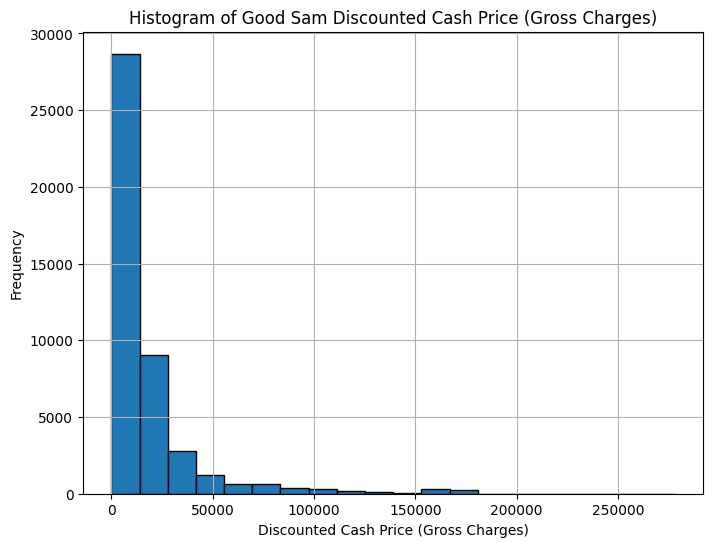

In [99]:
# Good Sam Discounted Cash Price Histogram
plt.figure(figsize=(8, 6))
plt.hist(df_goodsam['Discounted Cash Price (Gross Charges)'], bins=20, edgecolor='k')
plt.xlabel('Discounted Cash Price (Gross Charges)')
plt.ylabel('Frequency')
plt.title('Histogram of Good Sam Discounted Cash Price (Gross Charges)')
plt.grid()
plt.show()

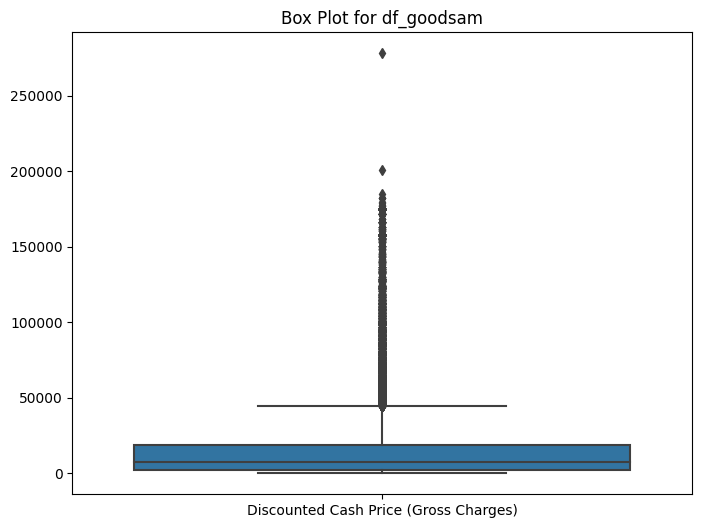

In [125]:
plt.figure(figsize=(8, 6))
sns.boxplot(data=df_goodsam)
plt.title('Box Plot for df_goodsam')
plt.show()

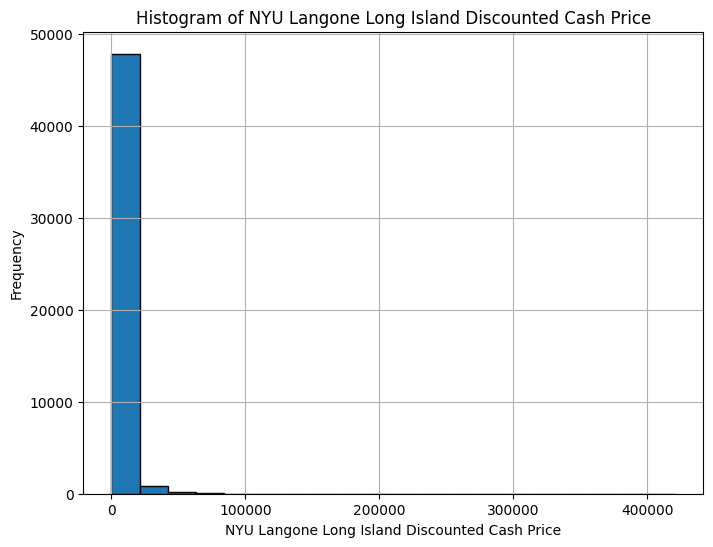

In [134]:
# NYU Long Island Discounted Cash Price Histogram
plt.figure(figsize=(8, 6))
plt.hist(df_nyu['NYU Langone Long Island Discounted Cash Price'], bins=20, edgecolor='k')
plt.xlabel('NYU Langone Long Island Discounted Cash Price')
plt.ylabel('Frequency')
plt.title('Histogram of NYU Langone Long Island Discounted Cash Price')
plt.grid()
plt.show()

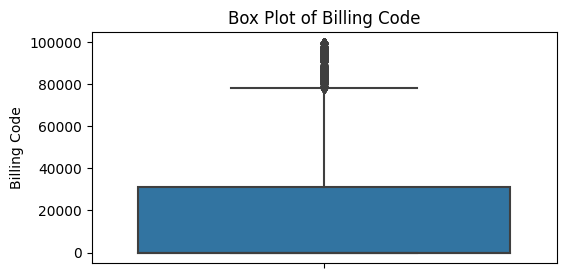

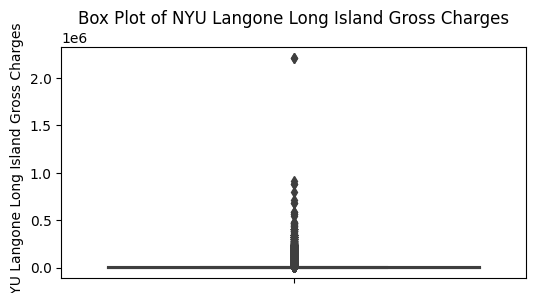

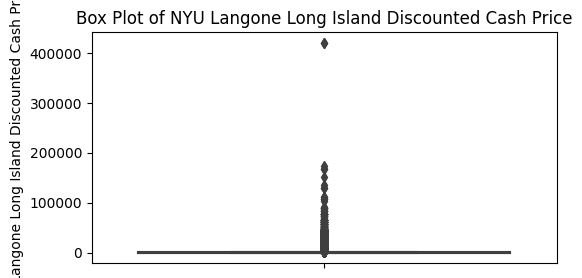

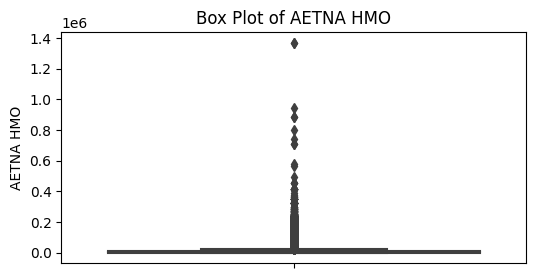

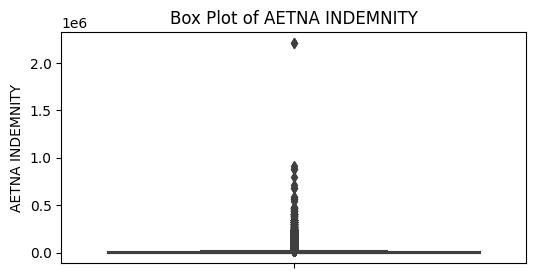

...

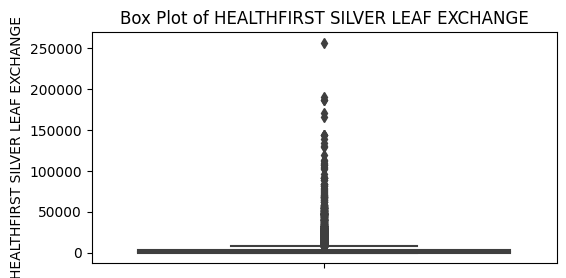

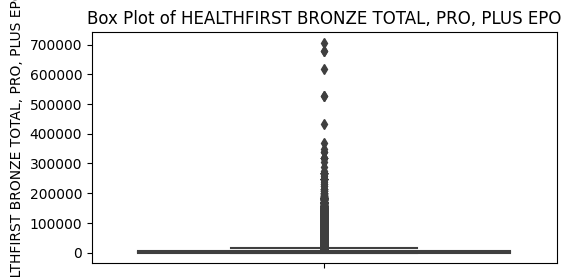

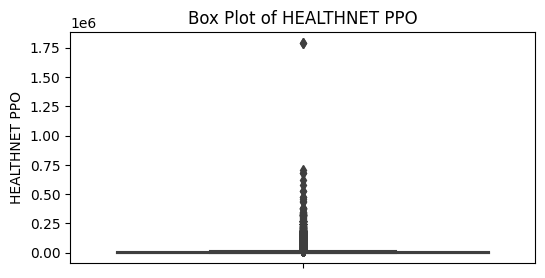

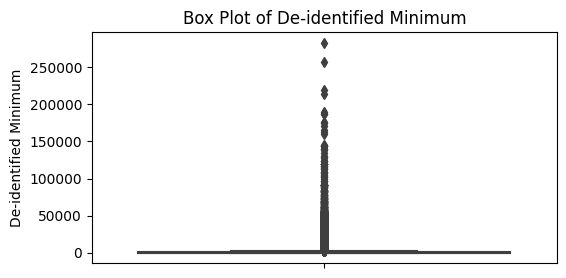

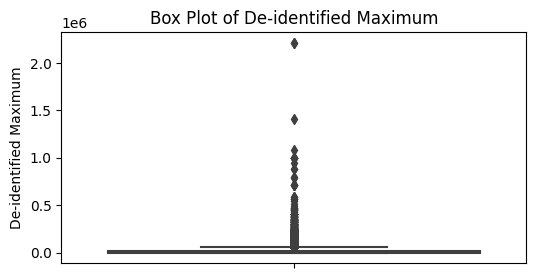

In [138]:
for col in df_nyu.select_dtypes(include=['int', 'float']):
    plt.figure(figsize=(6, 3))
    sns.boxplot(data=df_nyu, y=col)
    plt.title(f'Box Plot of {col}')
    plt.show()

^ Literally created so many boxplots, the execution took 2 whole minutes

# SQLite Database Operations

### Import packages

In [127]:
from sqlalchemy  import create_engine
import sqlite3

### Creating a temporary + local DB using SQLITE

In [141]:
conn = sqlite3.connect('health.db')
c = conn.cursor()

In [149]:
c.execute('''
            CREATE TABLE patient_data (
              patient_ID INTEGER PRIMARY KEY AUTOINCREMENT,
              name TEXT,
              age INTEGER,
              gender TEXT,
              weight_lbs REAL,
              height_ft REAL
            );
        ''')
conn.commit()

In [151]:
# confirming that the new table has been created (the health data table is a mistake and will be ignored)
c.execute('''
  SELECT name
  FROM sqlite_master
  WHERE type='table';
  ''')

c.fetchall()

[('health_data',), ('patient_data',), ('sqlite_sequence',)]

In [155]:
# Inserting data
sql_query = """

INSERT INTO patient_data (
  'name',
  'age',
  'gender',
  'weight_lbs',
  'height_ft'
  )
  values
  ('Astarion Ancunin', 39, 'Male', 165, 5.75),
  ('Gale Dekarios', 42, 'Male', 170, 6.2),
  ('Wyll Ravengard', 28, 'Male', 200, 6);
"""
print(sql_query)



INSERT INTO patient_data (
  'name',
  'age',
  'gender',
  'weight_lbs',
  'height_ft'
  )
  values 
  ('Astarion Ancunin', 39, 'Male', 165, 5.75),
  ('Gale Dekarios', 42, 'Male', 170, 6.2),
  ('Wyll Ravengard', 28, 'Male', 200, 6);



In [156]:
c.execute(sql_query)
conn.commit()

In [157]:
# Checking that the data has been inserted
sql_query_2 = """

select *
from patient_data;

"""

c.execute(sql_query_2)
print(c.fetchall())

[(1, 'Astarion Ancunin', 39, 'Male', 165.0, 5.75), (2, 'Gale Dekarios', 42, 'Male', 170.0, 6.2), (3, 'Wyll Ravengard', 28, 'Male', 200.0, 6.0)]


In [158]:
# Using Pandas to read the inserted data
pd.read_sql_query("select * from patient_data;", conn)

,patient_ID,name,age,gender,weight_lbs,height_ft
0,1,Astarion Ancunin,39,Male,165.0,5.75
1,2,Gale Dekarios,42,Male,170.0,6.20
2,3,Wyll Ravengard,28,Male,200.0,6.00


### Automatic Table Creation

In [165]:
# Connect to the SQLite database (create one if it doesn't exist)
conn = sqlite3.connect('health.db')

# Use the 'to_sql' function to create a table from the DataFrame
# Set 'index' to False to exclude the DataFrame index as a column
df_goodsam.to_sql('goodsam_data', conn, if_exists='replace', index=False)
conn.commit()

In [166]:
query = "SELECT * FROM goodsam_data"
df_read = pd.read_sql_query(query, conn)
df_read

,Procedure ID,HCPCS/CPT Code,Description,Gross Charge,Discounted Cash Price (Gross Charges)
0,124,,FORCEPS BBCK ENDO BOWEL,3114,3114.0
1,350,,ADAPTER SYR 18GA LUER ST,141,141.0
2,380,,ADAPTER MALE LL 3/16,1432,1432.0
3,1350,,CLP ANRSM 9X3.5MM SGTA27,8079,8079.0
4,1360,,CLP ANRSM 9X5MM SGTA30,8079,8079.0
...,...,...,...,...,...
44507,953180,,PROCEDURE CATEGORY 2,10370,10370.0
44508,953181,,PROCEDURE CATEGORY 3,13826,13826.0
44509,953182,,LABOR LEVEL I,28259,28259.0
44510,953183,,LABOR LEVEL II,56517,56517.0


In [167]:
# Close the database connection
conn.close()